# Analyse the Classification performance under Frequency Manipulations. 


In [1]:
WORKDIR = "/home/wustl/Dummy/Wustl/Deepfake/MasterThesis"  # specify WORKDIR here

### Imports

In [2]:

import matplotlib.pyplot as plt
import numpy as np 
import json
import os 
import json
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import seaborn as sns


from paper_utils import get_figsize, configure_matplotlib, create_subplot_mosaic
from calculate_MMD import get_files_from_directory,get_files_from_sub_directory


Generators = ["ProGAN", "StyleGAN", "ProjectedGAN", "Diff-StyleGAN2", "Diff-ProjectedGAN", "DDPM", "IDDPM", "ADM", "PNDM", "LDM", "coco"]

Gans = ["ProGAN", "StyleGAN", "ProjectedGAN", "Diff-StyleGAN2", "Diff-ProjectedGAN"]
Diffs = ["DDPM", "IDDPM", "ADM", "PNDM", "LDM"]



Base functions

In [3]:
configure_matplotlib(
    rc={
        "xtick.labelbottom": False,
        "xtick.bottom": True,
        "xtick.labeltop": True,
        "ytick.left": True,
        "ytick.right": False,
        "figure.constrained_layout.use": False,
        "savefig.pad_inches": 0.01,
    }
)


In [4]:
import json 
import pandas as pd
from calculate_MMD import get_files_from_directory,get_files_from_sub_directory
experiments = {}
path_names = []
base_input_folder = "/home/wustl/Dummy/Wustl/Deepfake/MasterThesis/results/classification/fda_ce"
all_files = get_files_from_directory(base_input_folder)


for experiment_name, files in all_files.items():
    for file in files:
        parts = file.split("/")[-1].split("_")
        generator_type = parts[-1].split(".")[0]
        model_name = parts[0]
        
        try:
            with open(file, "r") as input_file:  # Assuming JSON file
                results = json.load(input_file)
        except Exception as e:
            print(f"Error reading {file}: {e}")
            continue
        experiments.setdefault(
            model_name, {}).setdefault(
                experiment_name, {}).setdefault(
                    generator_type, {metric: metric_value for  key, value in results.items() for metrics in value for metric, metric_value in metrics.items()} )
                                      
                                     

data = []
for encoder_name, experiment_dict in experiments.items():
    for experiment_name, generator_dict in experiment_dict.items():
        for generator_type, metrics_dict in generator_dict.items():
                # Create a dictionary for each combination
            flattened_dict = {
                'Encoder': encoder_name,
                'Experiment': experiment_name,
                'Generator': generator_type,
            }
            # Add all metrics to this dictionary
            flattened_dict.update(metrics_dict)
            data.append(flattened_dict)

# Converting to a DataFrame
df = pd.DataFrame(data)
print(df)
df['tendency_to_overclassify_positive'] = 1 - df['test_precision']
    
df['tendency_to_overclassify_negative'] = 1 - df['test_recall']
df.to_csv("classification_fda_results.csv")


      Encoder Experiment          Generator  test_acc  test_recall  \
0    OpenClip      IDDPM                LDM     0.770     0.852597   
1    OpenClip      IDDPM  Diff-ProjectedGAN     0.749     0.821609   
2    OpenClip      IDDPM              IDDPM     0.778     0.877141   
3    OpenClip      IDDPM               DDPM     0.767     0.838463   
4    OpenClip      IDDPM                ADM     0.770     0.851753   
..        ...        ...                ...       ...          ...   
237    DinoV2        ADM                ADM     0.751     0.765823   
238    DinoV2        ADM  Diff-ProjectedGAN     0.763     0.764601   
239    DinoV2        ADM              IDDPM     0.772     0.777369   
240    DinoV2        ADM                LDM     0.766     0.775901   
241    DinoV2        ADM               PNDM     0.768     0.782684   

     test_precision  test_roc_auc  test_pd_10  test_pd_05  test_pd_01  \
0          0.842653      0.825962    0.605061    0.475823         0.0   
1          0.

### Compare the two generators.

First we want to understand how the two generators trained on the specific data behave when no filters are applied. Here we want to see if under normal condiations, which model handles the case of new type of generators better, see if there are any tendencies to overclassify either fake or real. 

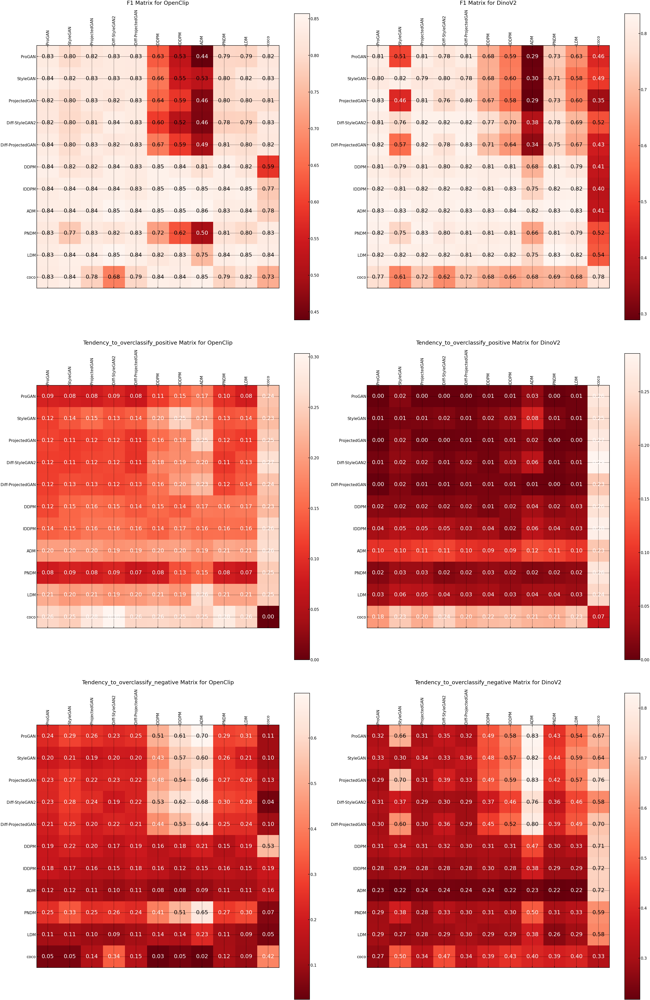

TypeError: 'NoneType' object is not callable

In [7]:
df_filtered = df
# Define the order of the experiments
experiment_order = ["ProGAN", "StyleGAN", "ProjectedGAN", "Diff-StyleGAN2", 
                    "Diff-ProjectedGAN", "DDPM", "IDDPM", "ADM", "PNDM", "LDM", "coco"]

# Convert the 'Experiment' column to a categorical type with the specified order
model_a = "OpenClip"  # Replace with the actual key for Model A
model_b = "DinoV2"  # Replace with the actual key for Model B

# Generators = ["ProGAN", "StyleGAN", "ProjectedGAN", "Diff-StyleGAN2", "Diff-ProjectedGAN", "DDPM", "IDDPM", "ADM", "PNDM", "LDM", "coco"]
metrics = ['test_f1', 'tendency_to_overclassify_positive', 'tendency_to_overclassify_negative']

# Create a figure with subplots for each metric
fig, axes = plt.subplots(len(metrics), 2, figsize=(12, 6 * len(metrics)))  # Adjust the figure size as needed

# Iterate over each metric
for i, metric in enumerate(metrics):
    # Create pivot tables for each model and metric
    pivot_a = df_filtered[df_filtered['Encoder'] == model_a].pivot(index='Experiment', columns='Generator', values=metric)
    pivot_b = df_filtered[df_filtered['Encoder'] == model_b].pivot(index='Experiment', columns='Generator', values=metric)
    
    # Reindex pivot tables to ensure order of Generators
    pivot_a = pivot_a.reindex(index=Generators, columns=Generators)
    pivot_b = pivot_b.reindex(index=Generators, columns=Generators)
    
    # Replace NaN values with zeros if necessary
    pivot_a = pivot_a.fillna(0)
    pivot_b = pivot_b.fillna(0)
    
    # Convert pivot tables to numpy arrays for plotting
    matrix_a = pivot_a.to_numpy()
    matrix_b = pivot_b.to_numpy()
    
    # First subplot for Model A
    cax1 = axes[i, 0].matshow(matrix_a, cmap=plt.cm.Reds_r)
    fig.colorbar(cax1, ax=axes[i, 0])
    axes[i, 0].set_xticks(np.arange(len(Generators)))
    axes[i, 0].set_yticks(np.arange(len(Generators)))
    axes[i, 0].set_xticklabels(Generators, rotation=90)
    axes[i, 0].set_yticklabels(Generators)
    axes[i, 0].set_title(f'{metric.replace("test_", "").capitalize()} Matrix for {model_a}')

    # Second subplot for Model B
    cax2 = axes[i, 1].matshow(matrix_b, cmap=plt.cm.Reds_r)
    fig.colorbar(cax2, ax=axes[i, 1])
    axes[i, 1].set_xticks(np.arange(len(Generators)))
    axes[i, 1].set_yticks(np.arange(len(Generators)))
    axes[i, 1].set_xticklabels(Generators, rotation=90)
    axes[i, 1].set_yticklabels(Generators)
    axes[i, 1].set_title(f'{metric.replace("test_", "").capitalize()} Matrix for {model_b}')

    # Adding value annotations for both matrices
    for ax, matrix in zip((axes[i, 0], axes[i, 1]), (matrix_a, matrix_b)):
        for (i, j), val in np.ndenumerate(matrix):
            text_color = 'white' if val < 0.5 else 'black'
            ax.text(j, i, f"{val:.2f}", ha='center', va='center', color=text_color)

plt.tight_layout()
plt.show()()
plt.show()

We can see, that clip has bigger problems handling diffusion trained models when trained on Gan generated data. Yet, clip can handle coco better when trained on gans and diffusion repectively. We can observe that clip tends classify images as real when faced with new type of generators. 

So in the following section, we should seperate between gan trained and diff trained models.

Now we want to see, how the models behave under the context of domain and generator shift?

/home/wustl/Dummy/Wustl/Deepfake/MasterThesis/.venv/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


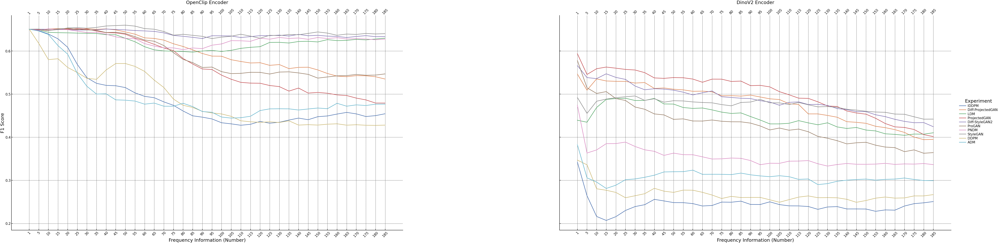

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
data = df[df['Number'] != "no"]

coco_data = data[(data['Generator'] == 'coco') & (data['Experiment'] != 'coco')]
g = sns.FacetGrid(coco_data, col='Encoder', hue='Experiment', col_wrap=2, height=5, aspect=2)
g = g.map(sns.lineplot, 'Number', 'test_f1')
g.add_legend()
g = g.set_titles("{col_name} Encoder")
g.set_axis_labels('Frequency Information (Number)', 'F1 Score')
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True)
    for label in ax.get_xticklabels():
        label.set_rotation(45)

# Adjust subplot params for a better fit
plt.subplots_adjust(hspace=0.3, wspace=0.4)
# Show the plot
plt.show()

ValueError: number sections must be larger than 0.

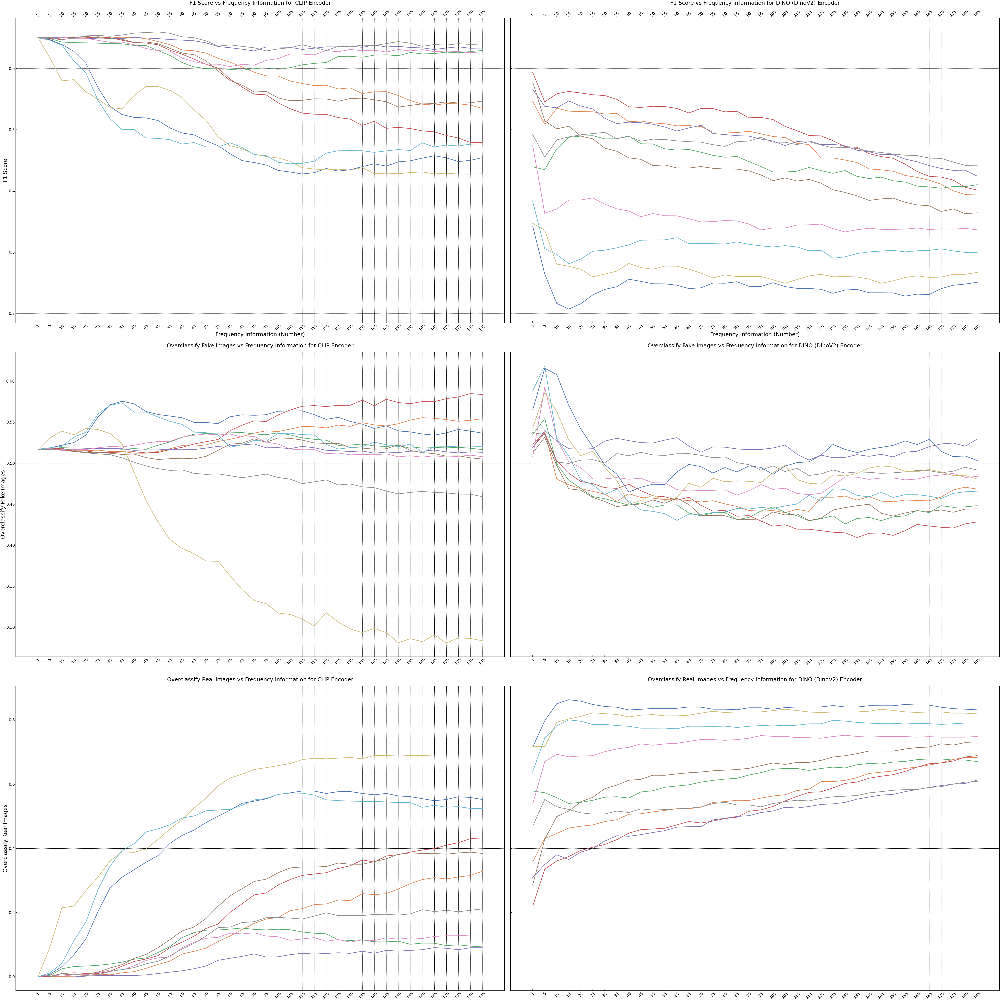

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
data = df[df['Number'] != "no"]

# Filter the data for the 'coco' generator type and exclude experiments that are 'coco'
coco_data = data[(data['Generator'] == 'coco') & (data['Experiment'] != 'coco')]

# Set up the matplotlib figure with subplots for each metric: F1, Precision, and Recall
fig, axes = plt.subplots(3, 2, figsize=(18, 18), sharex=True, sharey='row')

# Define the metrics and their titles
metrics = ['test_f1', 'tendency_to_overclassify_positive', 'tendency_to_overclassify_negative']
titles = ['F1 Score', 'Overclassify Fake Images', 'Overclassify Real Images']

# Loop through each metric and create the corresponding line plots
for i, metric in enumerate(metrics):
    # CLIP Encoder plot for the current metric
    sns.lineplot(ax=axes[i, 0], data=coco_data[coco_data['Encoder'] == 'OpenClip'],
                 x='Number', y=metric, hue='Experiment', legend=False)
    axes[i, 0].set_title(f'{titles[i]} vs Frequency Information for CLIP Encoder')
    axes[i, 0].set_xlabel('Frequency Information (Number)')
    axes[i, 0].set_ylabel(titles[i])
    axes[i, 0].tick_params(labelbottom=True)
    for label in axes[i, 0].get_xticklabels():
        label.set_rotation(45)

    # DinoV2 Encoder plot for the current metric
    sns.lineplot(ax=axes[i, 1], data=coco_data[coco_data['Encoder'] == 'DinoV2'],
                 x='Number', y=metric, hue='Experiment', legend=False)
    axes[i, 1].set_title(f'{titles[i]} vs Frequency Information for DINO (DinoV2) Encoder')
    axes[i, 1].set_xlabel('Frequency Information (Number)')
    axes[i, 1].set_ylabel(titles[i])
    axes[i, 1].tick_params(labelbottom=True)
    for label in axes[i, 1].get_xticklabels():
        label.set_rotation(45)

# Adjust the layout
plt.tight_layout()

# Add a legend for the whole figure
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=len(labels), title='Experiment')

# Show the plot
plt.show()

Following the opservation, that the models trained on the gan images perform worse on the DM generated images, we want to see if this is due to a bias twoards a certain frequency spectrum. 

### The Impact of Frequency Removal on the Classification Performace. 

To Understand if or even which frequency bands are most important for the classification of a given generator, we low pass filter the image using a butterworth filter. Butterworth has the advandge of generating less "rippels" aka artifcats in the inverse fourier. So we increase with a step size of 5 the filter, and see how that impacts the classification performance. It is important that we take the False Postive and False Negative Rate into perspective, as a High flase postive would indicate a a fake image dump, while a false negative rate, would indicate a basis towards classifiying images as real. 


As a first step, we want to compare the two models for all experiments and generators. We do this, to see if there are any specific patterns that are destinc towards the encoder. As coco was trained on a completely different dataset, we exclude it for the analysis, as it would not be a fair comparison. We also remove the performance on the own data.
Then we also plot the recall, to see if the model starts to overclassify images a real, even though they are fake. Meaning, it starts to dump images into the real category.

Then we also plot the precision, to see if the model starts to overclassify images a fake, even though they are real. Meaning, it starts to dump images into the fake category.


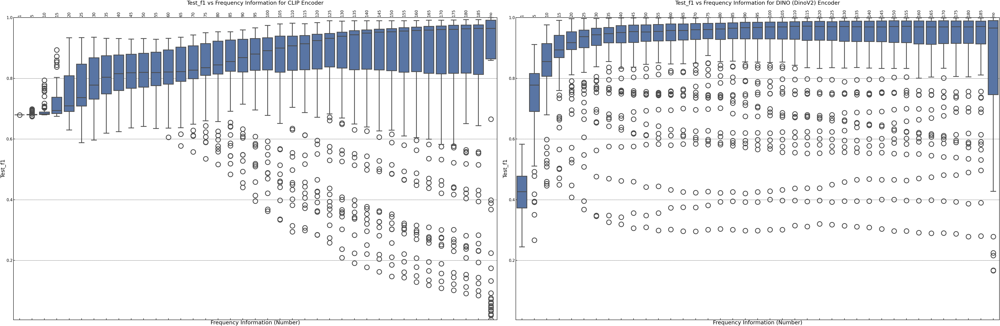

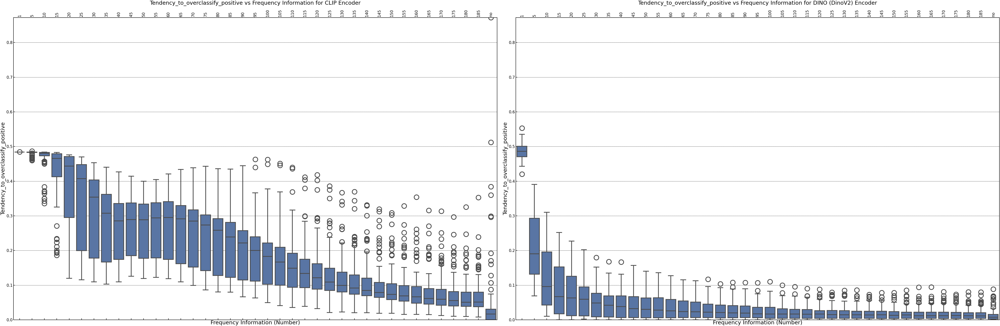

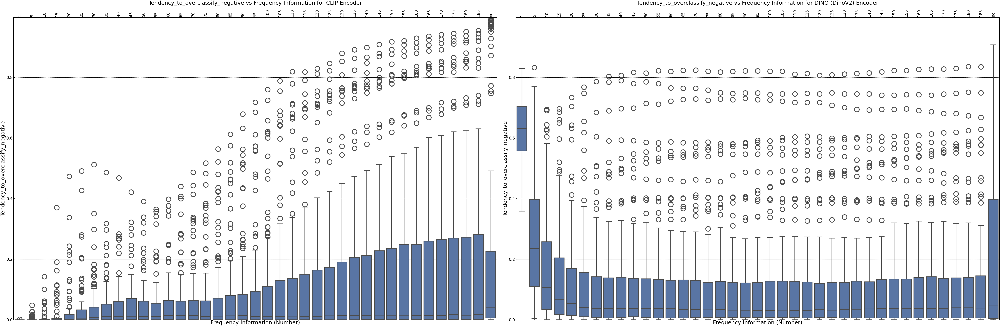

In [ ]:
filtered_data = df[(df['Experiment'] != 'coco') & (df['Generator'] != 'coco')]
filtered_data = filtered_data[filtered_data['Generator'] != filtered_data['Experiment']]
dino_data_corrected = filtered_data[filtered_data['Encoder'] == 'DinoV2']
clip_data = filtered_data[filtered_data['Encoder'] == 'OpenClip']
metrics = ['test_f1', 'tendency_to_overclassify_positive', 'tendency_to_overclassify_negative']
sns.set_palette('deep')


# Creating a figure for each metric
for metric in metrics:
    global_min_y = filtered_data[metric].min()
    global_max_y = filtered_data[metric].max()
    plt.figure(figsize=(18, 6))

    # Boxplot for CLIP encoder
    plt.subplot(1, 2, 1)
    sns.boxplot(x='Number', y=metric, data=clip_data)
    plt.xticks(rotation=90)
    plt.ylim(global_min_y, global_max_y) 
    plt.title(f'{metric.capitalize().replace("test_", "")} vs Frequency Information for CLIP Encoder')
    plt.xlabel('Frequency Information (Number)')
    plt.ylabel(metric.capitalize().replace("test_", ""))

    # Boxplot for DINO (DinoV2) encoder
    plt.subplot(1, 2, 2)
    if not dino_data_corrected.empty:
        sns.boxplot(x='Number', y=metric, data=dino_data_corrected)
        plt.xticks(rotation=90)
        plt.ylim(global_min_y, global_max_y) 
        plt.title(f'{metric.capitalize().replace("test_", "")} vs Frequency Information for DINO (DinoV2) Encoder')
        plt.xlabel('Frequency Information (Number)')
        plt.ylabel(metric.capitalize().replace("test_", ""))
    else:
        plt.text(0.5, 0.5, f'No data available for DINO (DinoV2) Encoder', 
                 horizontalalignment='center', verticalalignment='center', 
                 transform=plt.gca().transAxes)
        plt.title('Data Unavailable for DINO (DinoV2)')

    plt.tight_layout()
    plt.show()

Now we check, if face with the same datatype, if model has different behaviour. We



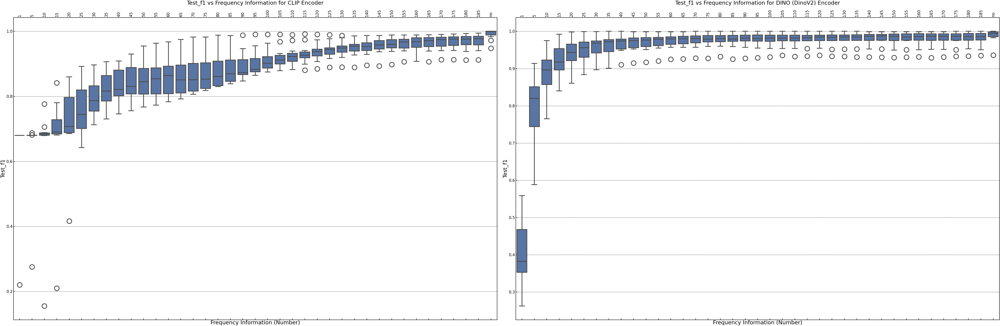

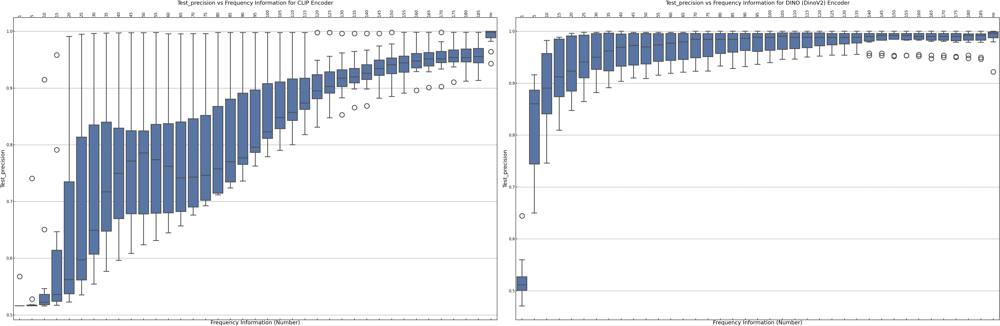

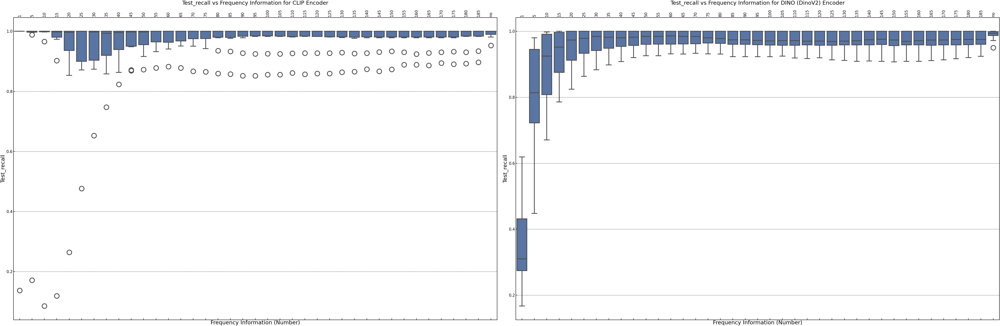

In [ ]:
filtered_data = df[df['Generator'] == df['Experiment']]
dino_data_corrected = filtered_data[filtered_data['Encoder'] == 'DinoV2']
clip_data = filtered_data[filtered_data['Encoder'] == 'OpenClip']
metrics = ['test_f1', 'test_precision', 'test_recall']
sns.set_palette('deep')
# Creating a figure for each metric
for metric in metrics:
    plt.figure(figsize=(18, 6))

    # Boxplot for CLIP encoder
    plt.subplot(1, 2, 1)
    sns.boxplot(x='Number', y=metric, data=clip_data)
    plt.xticks(rotation=90)
    plt.title(f'{metric.capitalize().replace("test_", "")} vs Frequency Information for CLIP Encoder')
    plt.xlabel('Frequency Information (Number)')
    plt.ylabel(metric.capitalize().replace("test_", ""))

    # Boxplot for DINO (DinoV2) encoder
    plt.subplot(1, 2, 2)
    if not dino_data_corrected.empty:
        sns.boxplot(x='Number', y=metric, data=dino_data_corrected)
        plt.xticks(rotation=90)
        plt.title(f'{metric.capitalize().replace("test_", "")} vs Frequency Information for DINO (DinoV2) Encoder')
        plt.xlabel('Frequency Information (Number)')
        plt.ylabel(metric.capitalize().replace("test_", ""))
    else:
        plt.text(0.5, 0.5, f'No data available for DINO (DinoV2) Encoder', 
                 horizontalalignment='center', verticalalignment='center', 
                 transform=plt.gca().transAxes)
        plt.title('Data Unavailable for DINO (DinoV2)')

    plt.tight_layout()
    plt.show()

If there is an easy distinction for example in the high frequency specturm for a model, that model should generally be better performing when when a input data also has that aspect. 

Here we compare how the different experiments behave. To Ensure no domain shift problems within the lsun trained generators. 

We also seperate between Gans and diffusion trained models. So that the generator will be diffs if trained on a gan and visa versa for diffs.

To better compare the plots, we have to 

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

data = df
data = data[data['Generator'] != "coco"]
data["Number"].replace("no", 200, inplace=True)
dino_data_corrected = data[data['Encoder'] == 'DinoV2']
clip_data = data[data['Encoder'] == 'OpenClip']
sns.set_palette('deep')
head_key = "Experiment"
y = "test_f1"
plt.figure(figsize=(18, len(data[head_key].unique()) * 6))

# Find global y-axis limits
global_min_y = data[y].min()
global_max_y = data[y].max()

for i, experiment in enumerate(data[head_key].unique()):
    dino_experiment_data = dino_data_corrected[dino_data_corrected[head_key] == experiment]
    clip_experiment_data = clip_data[clip_data[head_key] == experiment]

    # Similar filtering for Gans and Diffs...

    # Boxplot for CLIP encoder
    plt.subplot(len(data[head_key].unique()), 2, 2*i + 1)
    if not clip_experiment_data.empty:
        sns.boxplot(x='Number', y=y, data=clip_experiment_data, color='lightgray')
        sns.pointplot(x='Number', y=y, data=clip_experiment_data, color='black', scale=0.75)
        plt.xticks(rotation=90)
        plt.ylim(global_min_y, global_max_y)  # Set the global y-axis limits
        plt.title(f'F1 Score vs Frequency Information for CLIP Encoder - {experiment}')
        plt.xlabel('Frequency Information (Number)')
        plt.ylabel('F1 Score')
    else:
        plt.text(0.5, 0.5, f'No data available for CLIP Encoder - {experiment}', 
                 horizontalalignment='center', verticalalignment='center', 
                 transform=plt.gca().transAxes)
        plt.title(f'Data Unavailable for CLIP - {experiment}')

    # Boxplot for DINO (DinoV2) encoder
    plt.subplot(len(data[head_key].unique()), 2, 2*i + 2)
    if not dino_experiment_data.empty:
        sns.boxplot(x='Number', y=y, data=dino_experiment_data, color='lightgray')
        sns.pointplot(x='Number', y=y, data=dino_experiment_data, color='black', scale=0.75)
        plt.xticks(rotation=90)
        plt.ylim(global_min_y, global_max_y)  # Set the global y-axis limits
        plt.title(f'F1 Score vs Frequency Information for DINO (DinoV2) Encoder - {experiment}')
        plt.xlabel('Frequency Information (Number)')
        plt.ylabel('F1 Score')
    else:
        plt.text(0.5, 0.5, f'No data available for DINO (DinoV2) Encoder - {experiment}', 
                 horizontalalignment='center', verticalalignment='center', 
                 transform=plt.gca().transAxes)
        plt.title(f'Data Unavailable for DINO (DinoV2) - {experiment}')

plt.tight_layout()
plt.show()


/tmp/ipykernel_3204053/1500864811.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Number"].replace("no", 200, inplace=True)
/tmp/ipykernel_3204053/1500864811.py:28: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(x='Number', y=y, data=clip_experiment_data, color='black', scale=0.75)


/tmp/ipykernel_3204053/1500864811.py:44: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(x='Number', y=y, data=dino_experiment_data, color='black', scale=0.75)
/tmp/ipykernel_3204053/1500864811.py:28: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(x='Number', y=y, data=clip_experiment_data, color='black', scale=0.75)
/tmp/ipykernel_3204053/1500864811.py:44: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(x='Number', y=y, data=dino_experiment_data, color='

### Analyse the impact of FDA Swichting on the Classification performance

When low frequencies from a real image are injected into a target image, a low recall rate indicates that the model is mistaking fake images for real ones. Initially, this might seem disadvantageous, as it could potentially allow the model to be tricked into classifying an altered image as genuine. However, it could also demonstrate the encoder's proficiency in processing low-level features. Ideally, this capability should result in a real image being correctly identified as real, hence a higher precision score. If the model fails to do so, it effectively creates a repository for misidentified real images. Moreover, the model may inaccurately flag images with unusual frequency characteristics as fake, even when such peculiarities arise from authentic, unaltered sources.






      Encoder Experiment          Generator  test_acc  test_recall  \
0    OpenClip      IDDPM                LDM     0.770     0.852597   
1    OpenClip      IDDPM  Diff-ProjectedGAN     0.749     0.821609   
2    OpenClip      IDDPM              IDDPM     0.778     0.877141   
3    OpenClip      IDDPM               DDPM     0.767     0.838463   
4    OpenClip      IDDPM                ADM     0.770     0.851753   
..        ...        ...                ...       ...          ...   
237    DinoV2        ADM                ADM     0.751     0.765823   
238    DinoV2        ADM  Diff-ProjectedGAN     0.763     0.764601   
239    DinoV2        ADM              IDDPM     0.772     0.777369   
240    DinoV2        ADM                LDM     0.766     0.775901   
241    DinoV2        ADM               PNDM     0.768     0.782684   

     test_precision  test_roc_auc  test_pd_10  test_pd_05  test_pd_01  \
0          0.842653      0.825962    0.605061    0.475823         0.0   
1          0.

      Encoder Experiment          Generator  test_acc  test_recall  \
0    OpenClip      IDDPM                LDM     0.770     0.852597   
1    OpenClip      IDDPM  Diff-ProjectedGAN     0.749     0.821609   
2    OpenClip      IDDPM              IDDPM     0.778     0.877141   
3    OpenClip      IDDPM               DDPM     0.767     0.838463   
4    OpenClip      IDDPM                ADM     0.770     0.851753   
..        ...        ...                ...       ...          ...   
237    DinoV2        ADM                ADM     0.751     0.765823   
238    DinoV2        ADM  Diff-ProjectedGAN     0.763     0.764601   
239    DinoV2        ADM              IDDPM     0.772     0.777369   
240    DinoV2        ADM                LDM     0.766     0.775901   
241    DinoV2        ADM               PNDM     0.768     0.782684   

     test_precision  test_roc_auc  test_pd_10  test_pd_05  test_pd_01  \
0          0.842653      0.825962    0.605061    0.475823         0.0   
1          0.

NameError: name 'plt' is not defined

### Analyse the 

In [ ]:
# Sorting function for x_labels
data = experiemnts["butt_low_5_sup_con.pkl"]

def custom_sort(val):
    return int(val) if val != "no" else 100  # Assigning a high value to "no" to make it appear first

# Plotting
plt.figure(figsize=(15, 8))

x_labels = sorted(data['OpenClip']["DDPM"].keys(), key=custom_sort, reverse=True)

for model, metric_data in data.items():
    for metric, values in metric_data.items():
        linear_vals = [values[key]['linear.pt'].item() for key in x_labels]
        encoder_vals = [values[key]['encoder.pt'].item() for key in x_labels]

        #plt.plot(x_labels, linear_vals, '-o', label=f'{model} {metric} Linear')
        plt.plot(x_labels, encoder_vals, '--*', label=f'{model} {metric} Encoder')

        print(f'{model} {metric} Linear', linear_vals)
        print(f'{model} {metric} Encoder', encoder_vals)

plt.title('Comparison of OpenClip and DinoV2 models')
plt.xlabel('X Axis Value')
plt.ylabel('Tensor Value')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

KeyError: 'butt_low_5_sup_con.pkl'

In [ ]:
# # Sorting function for x_labels
# data = experiemnts["butt_band_5_sup_con.pkl"]
# def custom_sort(val):
#     return int(val) if val != "no" else 100  # Assigning a high value to "no" to make it appear first

# # Plotting
# plt.figure(figsize=(15, 8))

# x_labels = sorted(data['OpenClip'].keys(), key=custom_sort)

# for model, values in data.items():
#     print(model)
#     linear_vals = [values[key]['linear.pt'].item() for key in x_labels]
#     encoder_vals = [values[key]['encoder.pt'].item() for key in x_labels]

#     plt.plot(x_labels, linear_vals, '-o', label=f'{model} Linear')
#     plt.plot(x_labels, encoder_vals, '--*', label=f'{model} Encoder')

# plt.title('Comparison of OpenClip and DinoV2 models')
# plt.xlabel('X Axis Value')
# plt.ylabel('Tensor Value')
# plt.legend()
# plt.grid(True)
# plt.tight_layout()
plt.show()

In [ ]:
# Sorting function for x_labels
data = experiemnts["butt_high_5_sup_con.pkl"]
def custom_sort(val):
    return int(val) if val != "no" else 0  # Assigning a high value to "no" to make it appear first

# Plotting
plt.figure(figsize=(15, 8))

x_labels = sorted(data['OpenClip'].keys(), key=custom_sort)

for model, values in data.items():
    print(model)
    linear_vals = [values[key]['linear.pt'].item() for key in x_labels]
    encoder_vals = [values[key]['encoder.pt'].item() for key in x_labels]

    plt.plot(x_labels, linear_vals, '-o', label=f'{model} Linear')
    plt.plot(x_labels, encoder_vals, '--*', label=f'{model} Encoder')

plt.title('Comparison of OpenClip and DinoV2 models')
plt.xlabel('X Axis Value')
plt.ylabel('Tensor Value')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

DinoV2


KeyError: 'linear.pt'

<Figure size 4500x2400 with 0 Axes>

### No filter vs filter evulation

In [ ]:
import pickle 
import os 
experiemnts = {}
path_names = []
base_input_folder = "/home/wustl/Dummy/Wustl/Deepfake/MasterThesis/results/mmd_features"
mmds = get_files_from_directory(base_input_folder)
mmd = mmds["no_filter_vs_filter"]
print(mmd)
for file in  mmd:
    
    with open(file, "rb") as input_file:
        mmds_GANs = pickle.load(input_file)
    experiemnt_name = file.split("/")[-1]
    experiemnts[experiemnt_name] = mmds_GANs
print(experiemnts["butt_low_5_sup_con.pkl"])

['/home/wustl/Dummy/Wustl/Deepfake/MasterThesis/results/mmd_features/no_filter_vs_filter/butt_high_5_sup_con.pkl', '/home/wustl/Dummy/Wustl/Deepfake/MasterThesis/results/mmd_features/no_filter_vs_filter/supContrastive.pkl', '/home/wustl/Dummy/Wustl/Deepfake/MasterThesis/results/mmd_features/no_filter_vs_filter/butt_low_5_sup_con.pkl']
{'0.0': {'OpenClip': {'no': {'linear.pt': {'45': array(0.29841083, dtype=float32), '25': array(0.41216987, dtype=float32), '15': array(0.5563323, dtype=float32), '35': array(0.33774692, dtype=float32), '60': array(0.2643795, dtype=float32), '10': array(0.6017748, dtype=float32), '80': array(0.23527074, dtype=float32), '85': array(0.21639276, dtype=float32), '75': array(0.25019318, dtype=float32), '5': array(0.5968559, dtype=float32), '50': array(0.28507233, dtype=float32), '65': array(0.26159573, dtype=float32), '40': array(0.31414646, dtype=float32), '55': array(0.27277017, dtype=float32), '20': array(0.47800452, dtype=float32), '70': array(0.25860238, d

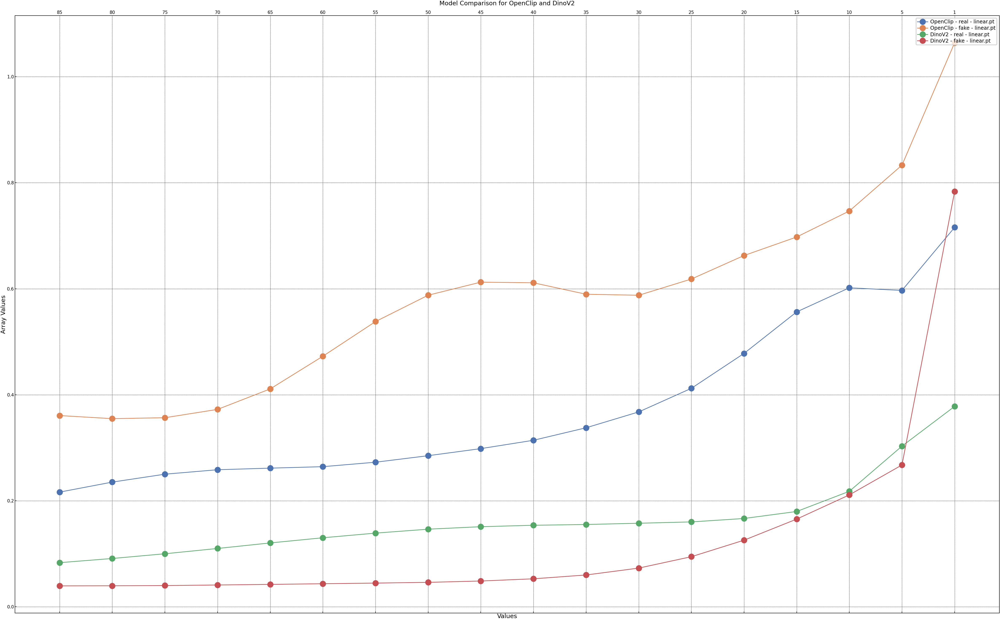

In [ ]:
labels_mapping = {
    "0.0": "Real",
    "1.0": "Fake"
}
data = experiemnts["butt_low_5_sup_con.pkl"]
sorted_keys = sorted([int(k) for k in data['0.0']['OpenClip']['no']['linear.pt'].keys()], reverse=True)
sorted_keys = [str(k) for k in sorted_keys]

labels =  sorted_keys

plt.figure(figsize=(16, 10))

# Plotting for 'OpenClip' Model
for model_name, label_name in [("0.0", "real"), ("1.0", "fake")]:
    values_linear_openclip = [data[model_name]['OpenClip']['no']['linear.pt'][key] for key in sorted_keys]
    values_encoder_openclip = [data[model_name]['OpenClip']['no']['encoder.pt'][key] for key in sorted_keys]
    plt.plot(labels, values_linear_openclip,'-o', label=f"OpenClip - {label_name} - linear.pt")
    #plt.plot(labels, values_encoder_openclip,'--*', label=f"OpenClip - {label_name} - encoder.pt")

# Plotting for 'DinoV2' Model
for model_name, label_name in [("0.0", "real"), ("1.0", "fake")]:
    values_linear_dinov2 = [data[model_name]['DinoV2']['no']['linear.pt'][key] for key in sorted_keys]
    values_encoder_dinov2 = [data[model_name]['DinoV2']['no']['encoder.pt'][key] for key in sorted_keys]
    plt.plot(labels, values_linear_dinov2,'-o', label=f"DinoV2 - {label_name} - linear.pt")
    #plt.plot(labels, values_encoder_dinov2,'--*', label=f"DinoV2 - {label_name} - encoder.pt")

plt.title('Model Comparison for OpenClip and DinoV2')
plt.xlabel('Values')
plt.ylabel('Array Values')
plt.legend(loc="upper right", fontsize='small')
plt.tight_layout()
plt.show()

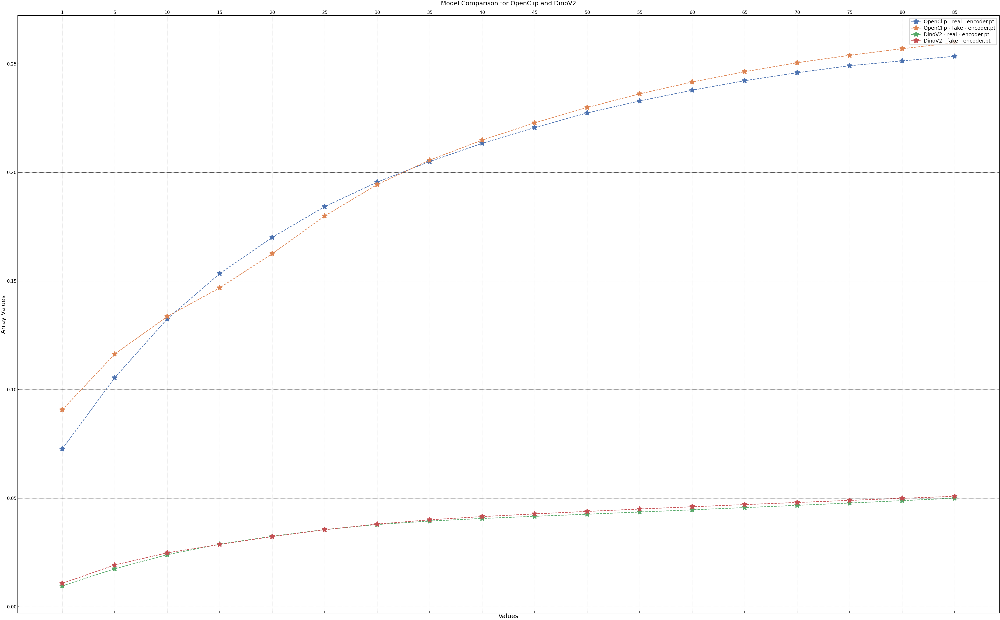

In [ ]:
labels_mapping = {
    "0.0": "Real",
    "1.0": "Fake"
}
data = experiemnts["butt_high_5_sup_con.pkl"]
sorted_keys = sorted([int(k) for k in data['0.0']['OpenClip']['no']['linear.pt'].keys()])
sorted_keys = [str(k) for k in sorted_keys]

labels =  sorted_keys

plt.figure(figsize=(16, 10))

# Plotting for 'OpenClip' Model
for model_name, label_name in [("0.0", "real"), ("1.0", "fake")]:
    values_linear_openclip = [data[model_name]['OpenClip']['no']['linear.pt'][key] for key in sorted_keys]
    values_encoder_openclip = [data[model_name]['OpenClip']['no']['encoder.pt'][key] for key in sorted_keys]
    #plt.plot(labels, values_linear_openclip,'-o', label=f"OpenClip - {label_name} - linear.pt")
    plt.plot(labels, values_encoder_openclip,'--*', label=f"OpenClip - {label_name} - encoder.pt")

# Plotting for 'DinoV2' Model
for model_name, label_name in [("0.0", "real"), ("1.0", "fake")]:
    values_linear_dinov2 = [data[model_name]['DinoV2']['no']['linear.pt'][key] for key in sorted_keys]
    values_encoder_dinov2 = [data[model_name]['DinoV2']['no']['encoder.pt'][key] for key in sorted_keys]
    #plt.plot(labels, values_linear_dinov2,'-o', label=f"DinoV2 - {label_name} - linear.pt")
    plt.plot(labels, values_encoder_dinov2,'--*', label=f"DinoV2 - {label_name} - encoder.pt")

plt.title('Model Comparison for OpenClip and DinoV2')
plt.xlabel('Values')
plt.ylabel('Array Values')
plt.legend(loc="upper right", fontsize='small')
plt.tight_layout()
plt.show()

In [ ]:
## Sort the experiments.

sorted_dict = {}

for key, value in experiemnts.items():
    experiemnt_key = key.split("_")[0]
    model_name = key.split("_")[1]
    
    if experiemnt_key not in sorted_dict.keys():
        sorted_dict[experiemnt_key] = {}
        
        #sorted_dict[experiemnt_key][model_name] = value
    
    sorted_dict[experiemnt_key][model_name] = value
print(sorted_dict.keys())

IndexError: list index out of range

How is the distribution between an unfiltered image and a filtered image for a real and a fake image?

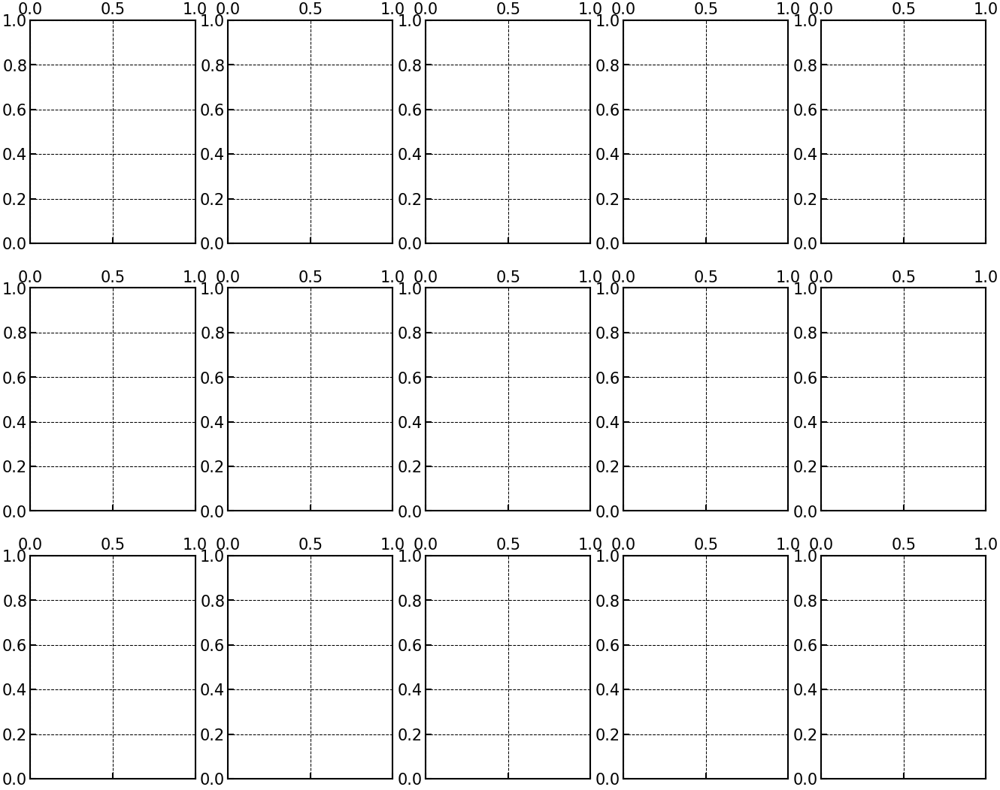

In [ ]:


fig, axd = plt.subplot_mosaic(
    [[0,1,2,3,4],[5,6,7,8,9],[10,11,12,13,14]],
    # set the height ratios between the rows
    height_ratios=[1, 1, 1],
    # set the width ratios between the columns
    width_ratios=[1, 1, 1, 1, 1],
    constrained_layout=False,
    figsize=get_figsize(ratio=0.8),
    sharey=False,
    sharex=False
)

desired_order_list = ["real", "", "01", "02", "03", "04", "05", "06", "07", "08","09"]

cm = plt.get_cmap('coolwarm')
# set global style for the axes
Clip_x_center = 0.1
DINO_x_center = -0.1
exp_name = "real_vs_fake"
my_xticks_pos = np.array([DINO_x_center, Clip_x_center])
my_xticks = ['DinoV2','OpenClip']

counter = 0

#exp_results = sorted_dict
for i, results in enumerate(sorted_dict.items()):
#for exp_name in ["0.0","1.0"]:
    #exp_results = sorted_dict[exp_name]
    ax = axd[counter]
    exp_name, exp_results = results
    clip = exp_results["OpenClip"]                                                                                                             
    dino = exp_results["DinoV2"]
    for DM, MMD_DM in clip.items():
        # if DM not in [ "00","real","09"]:#, 
        #     continue
        ax.scatter(Clip_x_center , MMD_DM, label=f'{DM}', alpha=0.9, zorder=4, color=cm((10 - desired_order_list.index(DM) + 5 )/ 10))
    # plot GAN values
    for GAN, MMD_GAN in dino.items():
        # if GAN not in ["00","real"]:# 
        #     continue
        ax.scatter(DINO_x_center, MMD_GAN, label=f'{GAN}', alpha=0.9, zorder=4, color=cm(desired_order_list.index(GAN) / 10))


    axd[counter].set_xlim(left=np.min(my_xticks_pos) * 2., right=np.max(my_xticks_pos) * 2.)
    axd[counter].set_ylim(bottom=0.0, top=1.0)
    ax.set_xticks(my_xticks_pos)
    ax.set_xticklabels(my_xticks)
    ax.set_title(exp_name,  loc="center")



    counter += 1
# handles, labels = fig.gca().get_legend_handles_labels()

# by_label = dict(zip(labels, handles))

# reordered_dict = {k: by_label[k] for k in desired_order_list}
# fig.legend(reordered_dict.values(), reordered_dict.keys(), ncol=2, borderpad=0.7,
#            bbox_to_anchor=(1.01, 0.55), labelspacing = 0.8, columnspacing=0.8)
plt.show()

## Now we want to see how the latent space behaves, when we compare the no filter images against the filtered images. For Fake and Real images.
Specifically we want to see, which model is more sensitive towards the manipulation of the frequency domain. 

In [ ]:
experiemnts = {}
path_names = []
base_input_folder = "/home/wustl/Dummy/Wustl/Deepfake/MasterThesis/results/mmd_features"
mmds = get_files_from_directory(base_input_folder)
mmd = mmds["fake_vs_real"]
print(mmd)
for file in  mmd:
    
    with open(file, "rb") as input_file:
        mmds_GANs = pickle.load(input_file)
    
    experiemnt_name = file.split("/")[-1]
    experiemnts[experiemnt_name] = mmds_GANs
print(experiemnts)
sorted_dict = {}

for key, value in experiemnts.items():
    experiemnt_key = key.split("_")[0]
    model_name = key.split("_")[1]
    if model_name not in sorted_dict.keys():
        sorted_dict[model_name] = {}
        
        #sorted_dict[experiemnt_key][model_name] = value
    sorted_dict[model_name][experiemnt_key] = value
print(sorted_dict.keys())
print(sorted_dict)


{}
{}
dict_keys([])
{}


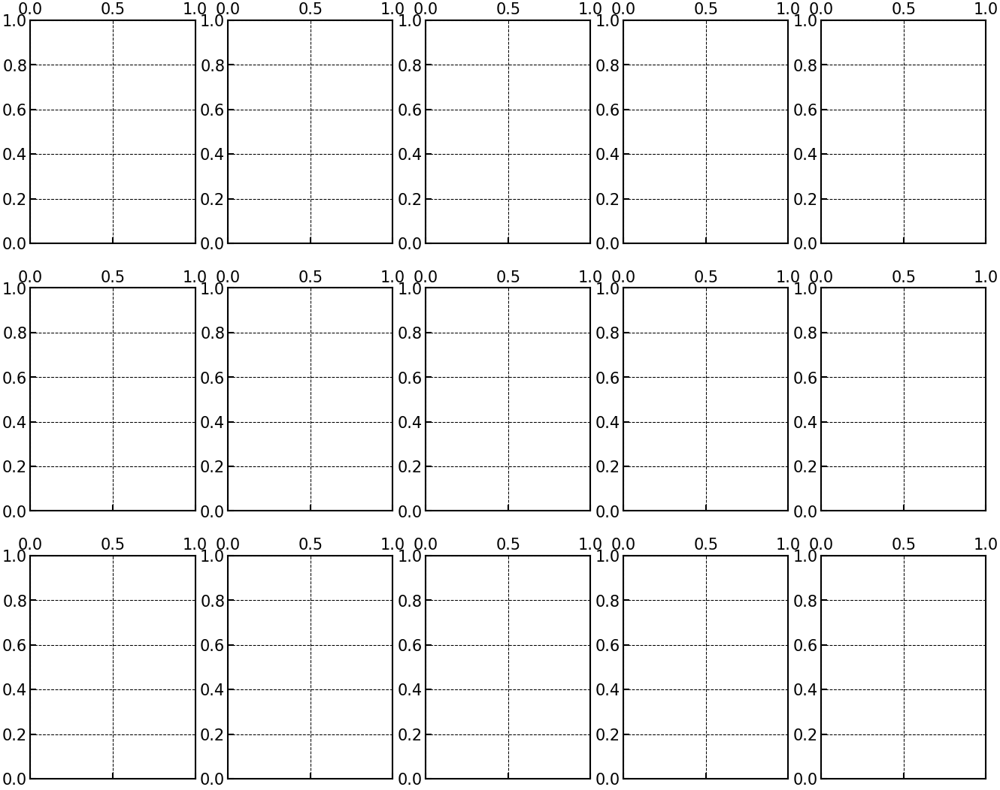

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, axd = plt.subplot_mosaic(
    [[0,1,2,3,4],[5,6,7,8,9],[10,11,12,13,14]],
    # set the height ratios between the rows
    height_ratios=[1, 1, 1],
    # set the width ratios between the columns
    width_ratios=[1, 1, 1, 1, 1],
    constrained_layout=False,
    figsize=get_figsize(ratio=0.8),
    sharey=False,
    sharex=False
)

desired_order_list = ["real", "00", "01", "02", "03", "04", "05", "06", "07", "08","09"]

cm = plt.get_cmap('coolwarm')
# set global style for the axes
Clip_x_center = 0.1
DINO_x_center = -0.1
my_xticks_pos = np.array([DINO_x_center, Clip_x_center])
my_xticks = ['Real','Fake',]

counter = 0
for  exp_name, value in sorted_dict.items():
    exp_results = sorted_dict[exp_name]
    ax = axd[counter]
    #exp_name, exp_results = results
    real = exp_results["0.0"]
    fake = exp_results["1.0"]
    ax.set_title(exp_name,  loc="center")

    for DM, MMD_DM in real.items():
        if DM not in ["00","01"]:
            continue
        ax.scatter(Clip_x_center , MMD_DM, label=f'{DM}', alpha=0.9, zorder=4, color=cm((10 - desired_order_list.index(DM) + 5 )/ 10))
    # plot GAN values
    for GAN, MMD_GAN in fake.items():
        if GAN not in ["00","01"]:
            continue
        ax.scatter(DINO_x_center, MMD_GAN, label=f'{GAN}', alpha=0.9, zorder=4, color=cm(desired_order_list.index(GAN) / 10))


    axd[counter].set_xlim(left=np.min(my_xticks_pos) * 2., right=np.max(my_xticks_pos) * 2.)


    axd[counter].set_ylim(bottom=0.0, top=0.3)
    ax.set_xticks(my_xticks_pos)
    ax.set_xticklabels(my_xticks)


    counter += 1
handles, labels = fig.gca().get_legend_handles_labels()

plt.show()